In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
!pip install torchvision
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ntstest/p01zhl42.jpg
/kaggle/input/ntstest/lelism.jpg
/kaggle/input/ntstest/geo4.png
/kaggle/input/ntstest/geo2.jfif
/kaggle/input/ntstest/hq720.jpg
/kaggle/input/ntstest/geo1.png
/kaggle/input/ntstest/mountian.jpg
/kaggle/input/ntstest/violet2.jpg
/kaggle/input/ntstest/GA311881_Bill_Gates.jpg
/kaggle/input/ntstest/download.jfif
/kaggle/input/ntstest/cloud1.jpg
/kaggle/input/ntstest/bg_anime.png
/kaggle/input/ntstest/eye.jpg
/kaggle/input/ntstest/jp.avif
/kaggle/input/ntstest/geo5.jfif
/kaggle/input/ntstest/bird.jpg
/kaggle/input/ntstest/violet.jpg
/kaggle/input/ntstest/demonslayer.jpg
/kaggle/input/ntstest/women2.jpg
/kaggle/input/ntstest/nightanime.jpg
/kaggle/input/ntstest/geo7.jpg
/kaggle/input/ntstest/abstract.jpg
/kaggle/input/ntstest/geo6.jfif
/kaggle/input/ntstest/landspaceanime.webp
/kaggle/input/ntstest/vanghog.jpeg
/kaggle/input/ntstest/viperartist1.jpeg
/kaggle/input/ntstest/firernoriginal.png
/kaggle/input/ntstest/landscape.jpg
/kaggle/input/ntstest/geo3.jfif

In [2]:
import torchvision 
import torch
from torchvision.models._utils import IntermediateLayerGetter
from torchvision.models import ResNet50_Weights,VGG19_Weights

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
torchvision.models.vgg19(weights=VGG19_Weights.IMAGENET1K_V1).to(device)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 86.3MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [5]:
def get_layer_values(md,x):
    layer_getter = [ md.features[0:5], md.features[5:10], md.features[10:19], md.features[19:28], md.features[28:37], md.avgpool ] 
    result = []
    inst = [torch.nn.InstanceNorm2d(64),torch.nn.InstanceNorm2d(128),torch.nn.InstanceNorm2d(256),torch.nn.InstanceNorm2d(512),torch.nn.InstanceNorm2d(512),torch.nn.Identity()]
    for i,l in enumerate(layer_getter):
        x = l(x)
        result.append(inst[i](x))
    return result


In [6]:
def filter_values(arr,indcs):
    res = []
    for i in indcs:
        res.append(arr[i])
    return arr

In [7]:
from matplotlib import pyplot as plt

class NTS:
    def __init__(self,n_epochs=50,pic_size=(512,728)):
        """
        In the constructor we instantiate four parameters and assign them as
        member parameters.
        """
        super().__init__()
        model =  torchvision.models.vgg19(weights=VGG19_Weights.IMAGENET1K_V1)
        model.to(device)
        model.eval()

        for param in model.parameters():
            param.requires_grad = False
        self.content_layers = lambda x : filter_values(get_layer_values(model,x),[4,5])
        self.style_layers = lambda x : filter_values(get_layer_values(model,x),[1,2,3,4])
        
        self.content_loss = torch.nn.MSELoss()        
        self.style_loss =  torch.nn.MSELoss() 
        
        self.n_epochs = n_epochs
        
        init_picture = torch.zeros((1,3,*pic_size),device=device)
        
        init_picture.requires_grad = True
        
        self.x = torch.nn.init.normal_(init_picture,0,0.1)
        self.pic_size = pic_size
        
        self.optimizer = torch.optim.LBFGS([self.x])

        
    def get_content(self,x):
        layers = self.content_layers(x)
        return torch.cat(list(map(lambda d: d.view(-1),layers)))
    
    def gram_matrix(tensor):
    
        # get the batch_size, depth, height, and width of the Tensor
        _, d, h, w = tensor.size()

        # reshape so we're multiplying the features for each channel
        tensor = tensor.view(d, h * w)

        # calculate the gram matrix
        gram = torch.mm(tensor, tensor.t())
    
        return gram
    
    def get_style(self,x):
        layers = self.style_layers(x)
        return torch.cat(list(map(lambda d: NTS.gram_matrix(d).view(-1),layers)))
        
    def get_loss(self):
        x_content_feature_maps = self.get_content(self.x)
        x_style_feature_maps = self.get_style(self.x)
        
        content_feature_maps = self.get_content(self.content)        
        content_loss = self.content_loss(x_content_feature_maps,content_feature_maps)
        
        style_loss = []
        for i,sty in enumerate(self.styles):
            style_feature_maps = self.get_style(torch.stack([sty]))
            style_loss.append(self.style_loss(x_style_feature_maps,style_feature_maps) * self.coefs[i] )
        style_loss = sum(style_loss)
        loss = content_loss + 0.00009 * style_loss + 5 * tv_loss(self.x)
        
        return loss
    
    def closure(self):
        self.optimizer.zero_grad()
        loss = self.get_loss()
        loss.backward()
        return loss
    
    def train(self,content,styles,coefs):
        self.content = content
        self.styles = styles
        self.coefs = coefs
        last_loss = 0
        style = styles[0]
        for e in range(self.n_epochs): 
            self.optimizer.step(self.closure)
            with torch.no_grad():
                if(e % 10 == 0):
                    print(f"{e} ---- {self.get_loss()} ")
                    fig,ax=plt.subplots()
                    ax.imshow(self.x.cpu().view(3,*self.pic_size).permute(1,2,0))
                    plt.show()

        return self.x

In [8]:
def tv_loss(Y_hat):
    return 0.5 * (torch.abs(Y_hat[:, :, 1:, :] - Y_hat[:, :, :-1, :]).mean() +
                  torch.abs(Y_hat[:, :, :, 1:] - Y_hat[:, :, :, :-1]).mean())

In [9]:
def rgb_to_yiq(rgb_tensor):
    # RGB to YIQ transformation matrix
    yiq_transform = torch.tensor([
        [0.299, 0.587, 0.114],
        [0.59590059, -0.27455667, -0.32134392],
        [0.21153661, -0.52273617, 0.31119955]
    ])

    # Reshape RGB tensor for matrix multiplication
    rgb_reshaped = rgb_tensor.view(3, -1)

    # Perform the conversion
    yiq_tensor = torch.mm(yiq_transform, rgb_reshaped)
    yiq_tensor = yiq_tensor.view(3, *rgb_tensor.shape[1:])
    return yiq_tensor

def yiq_to_rgb(yiq_tensor):
    # YIQ to RGB transformation matrix
    rgb_transform = torch.tensor([
        [1.0, 0.95629572, 0.6251234],
        [1.0, -0.27212209, -0.64738096],
        [1.0, -1.10698905, 1.70461449]
    ])

    # Reshape YIQ tensor for matrix multiplication
    yiq_reshaped = yiq_tensor.view(3, -1)

    # Perform the conversion
    rgb_tensor = torch.mm(rgb_transform, yiq_reshaped)
    rgb_tensor = rgb_tensor.view(3, *yiq_tensor.shape[1:])
    return rgb_tensor

def process_luminance(style,content):
    s_sd = torch.std(style)   
    c_sd = torch.std(content)
    s_m = torch.mean(style)   
    c_m = torch.mean(content)
    return (style - s_m)*(c_sd/s_sd) + c_m

In [10]:
class TrainMat():
    def __init__(self,content_path,styles_paths,coefs,epoch=100,pic_size = (512,728)):
        resizer = torchvision.transforms.Resize(size=pic_size,antialias = True)
        self.content = resizer(torchvision.io.read_image(content_path)).float() 
        self.styles = [ resizer(torchvision.io.read_image(style_path)).float() for style_path in styles_paths]
        self.coefs = np.array(coefs)
        self.coefs = coefs / np.sum(self.coefs)
        self.style2yiq =  [ rgb_to_yiq(style).float() for style in self.styles]
        self.content2yiq = rgb_to_yiq(self.content).float()

#         for el in self.style2yiq:
#             el[0,:,:] = process_luminance(el[0,:,:].float(),self.content2yiq[0,:,:].float())
        plt.imshow(yiq_to_rgb(self.content2yiq).int().permute(1,2,0))
    
        self.model = NTS(epoch,pic_size)
        
    def get_images(self):
        return self.content,self.styles,self.content2yiq,self.style2yiq

    def train_style(self):

        content_l = torch.stack([self.content2yiq[0],self.content2yiq[0],self.content2yiq[0]])/255.0
        style_l = [torch.stack([el[0],el[1],el[2]])/255.0 for el in self.style2yiq]

        content = torch.stack([content_l]).to(device)
        style = torch.stack(style_l).to(device)
        
        res = self.model.train(content.to(device),style.to(device),torch.Tensor(self.coefs).to(device))
        return res

In [11]:
def show_images(trainer,res):
    _,__,content2yiq ,style2yiq = trainer.get_images()

    with torch.no_grad():
        from matplotlib import pyplot as plt
        output = res[0].cpu().detach()
        for indx in range(len(style2yiq)):
            ref = style2yiq[indx-1]
            print(f"Style {indx}")
            plt.imshow(yiq_to_rgb(torch.stack([process_luminance(output[0],content2yiq[0]),process_luminance(output[1],ref[1]),process_luminance(output[2],ref[2])])).int().permute(1,2,0))
            plt.show()
            
        print("Generated")
        plt.imshow(yiq_to_rgb(torch.stack([process_luminance(output[0],content2yiq[0]),process_luminance(content2yiq[1],content2yiq[1]),process_luminance(content2yiq[2],content2yiq[2])])).int().permute(1,2,0))
        plt.show()
    
    
        print("Original Color Space")
        plt.imshow(yiq_to_rgb(torch.stack([process_luminance(output[0],content2yiq[0]),process_luminance(output[1],content2yiq[1]),process_luminance(output[2],content2yiq[2])])).int().permute(1,2,0))
        plt.show()


0 ---- 39.970237731933594 


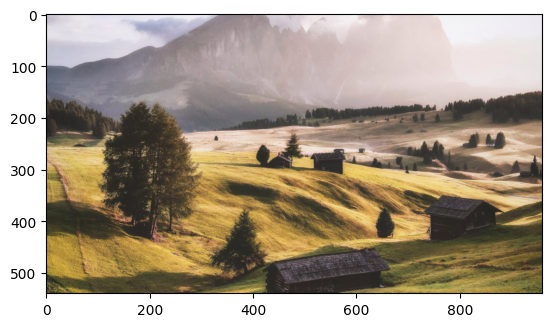

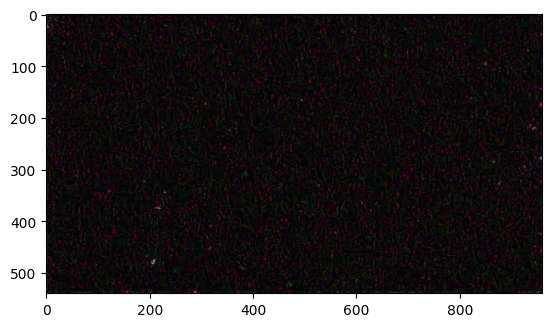

10 ---- 18.722822189331055 


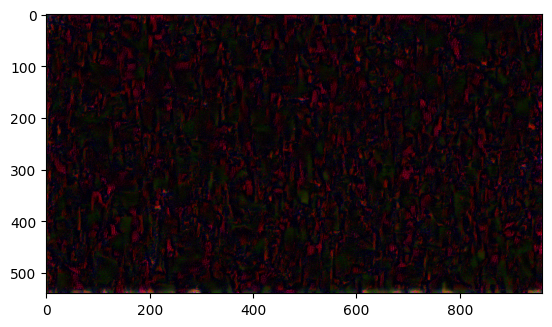

20 ---- 17.384479522705078 


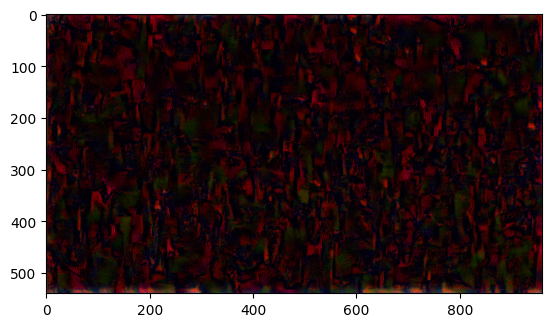

30 ---- 16.975814819335938 


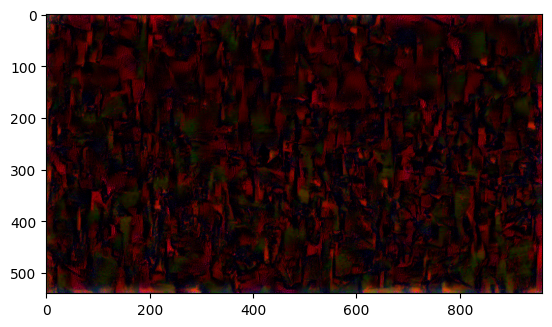

40 ---- 16.764097213745117 


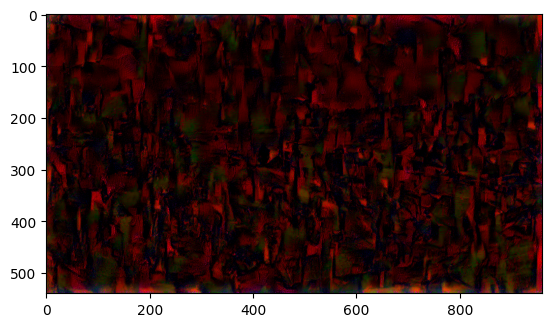

50 ---- 16.64107894897461 


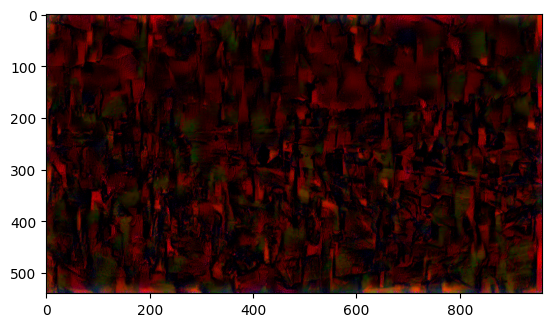

60 ---- 16.551591873168945 


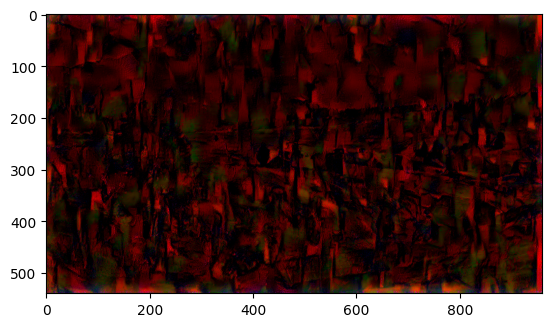

70 ---- 16.480712890625 


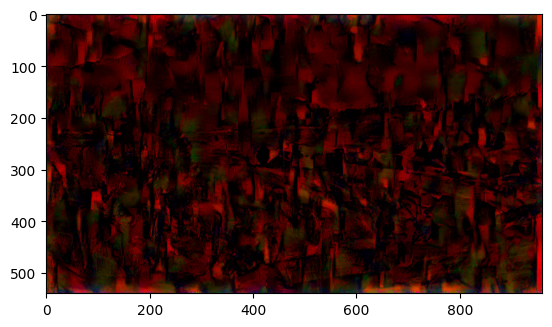

80 ---- 16.4255428314209 


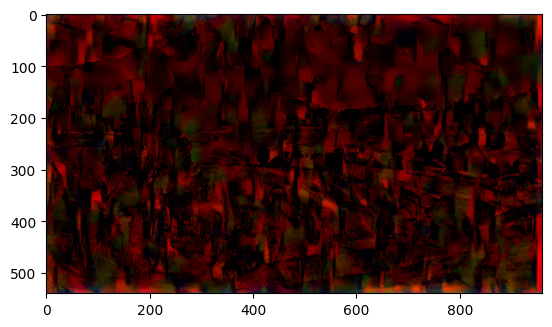

90 ---- 16.38166046142578 


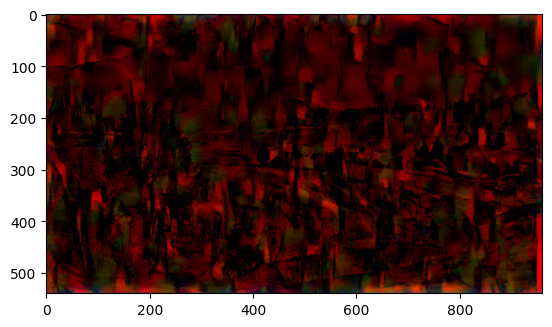

In [12]:
trainer_1 = TrainMat("/kaggle/input/ntstest/landscape.jpg",["/kaggle/input/ntstest/lelism.jpg","/kaggle/input/ntstest/twonanime.jpg"],[2,1],100,(1080//2,1920//2))
res_1 = trainer_1.train_style()

Style 0


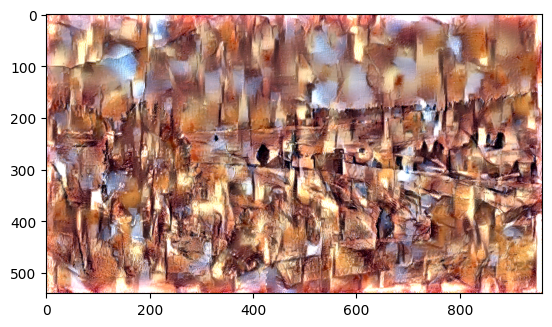

Style 1


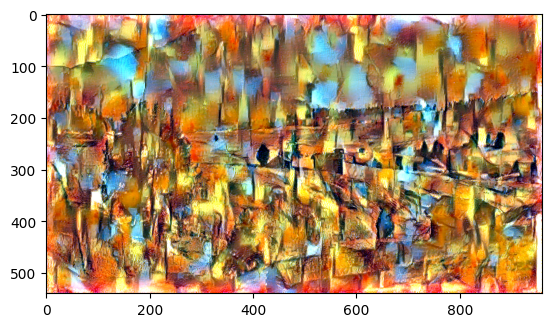

Generated


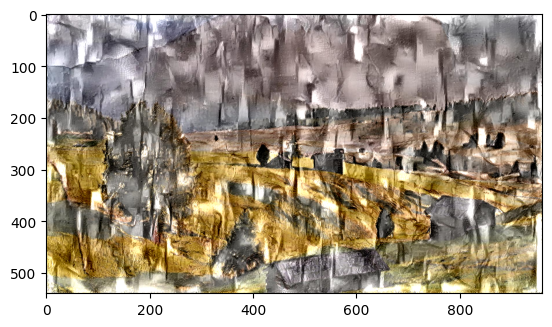

Original Color Space


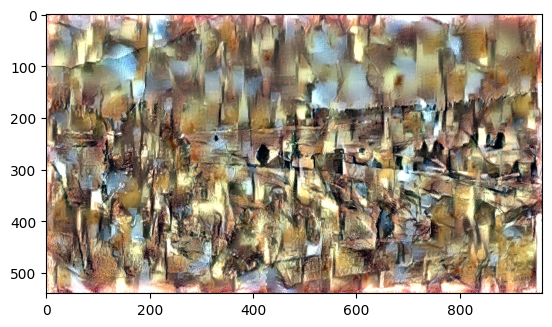

In [13]:
show_images(trainer_1,res_1)

0 ---- 59.30042266845703 


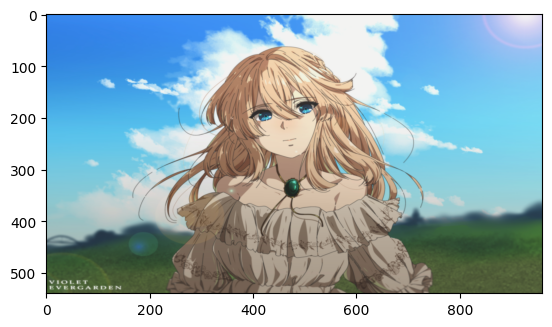

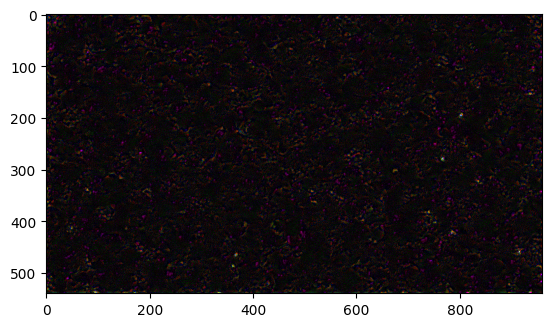

10 ---- 32.41792678833008 


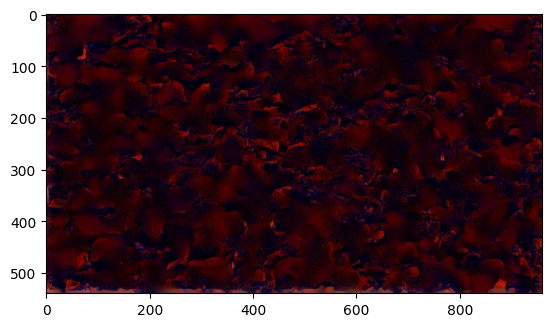

20 ---- 31.575525283813477 


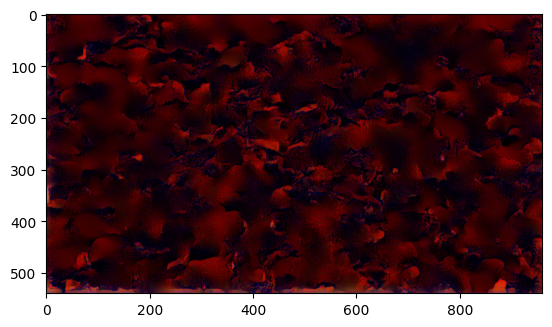

30 ---- 31.25042724609375 


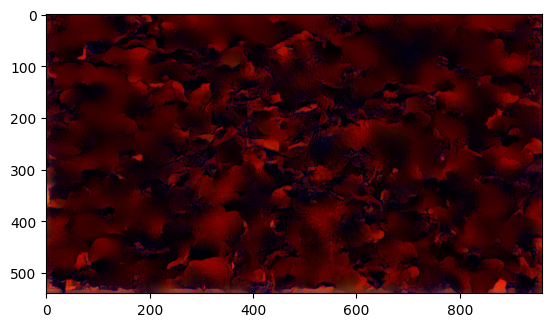

40 ---- 31.031444549560547 


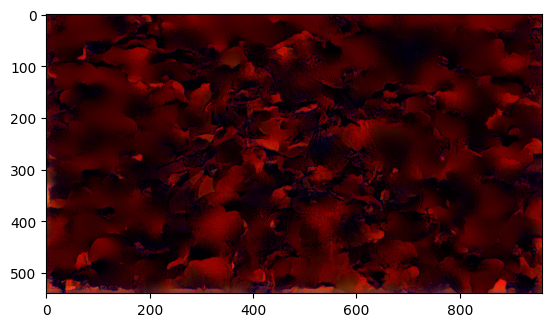

50 ---- 30.864482879638672 


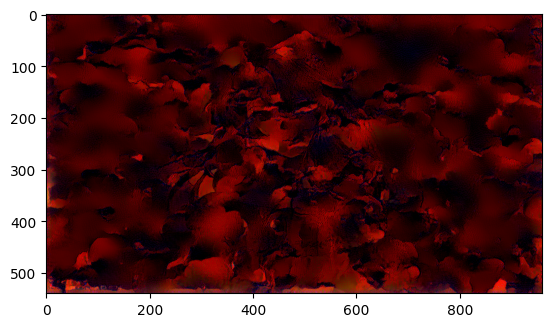

60 ---- 30.75252342224121 


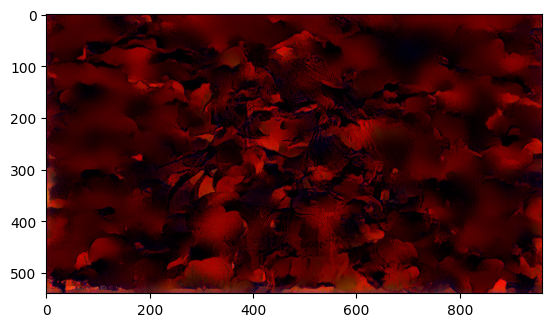

70 ---- 30.669200897216797 


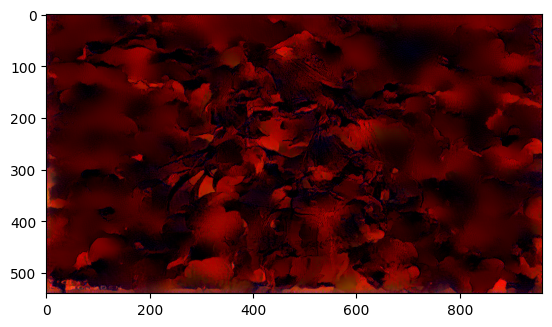

80 ---- 30.60531234741211 


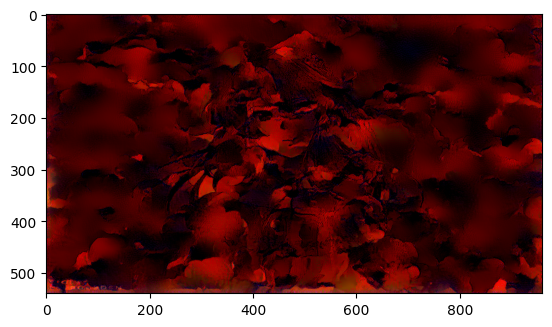

90 ---- 30.557994842529297 


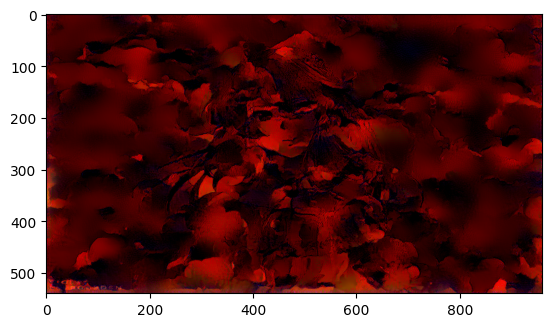

In [14]:
trainer_2 = TrainMat("/kaggle/input/ntstest/violet2.jpg",["/kaggle/input/ntstest/cloud1.jpg","/kaggle/input/ntstest/geo4.png"],[10,3],100,(1080//2,1920//2))
res_2 = trainer_2.train_style()

Style 0


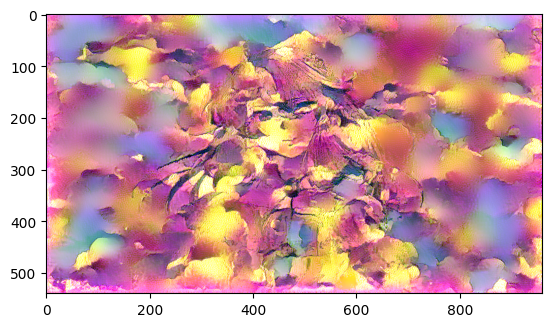

Style 1


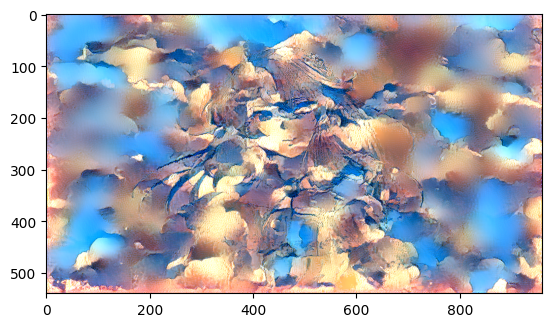

Generated


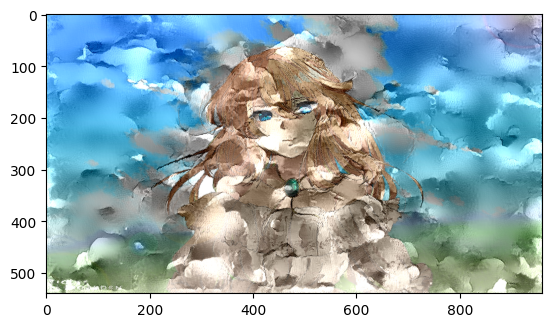

Original Color Space


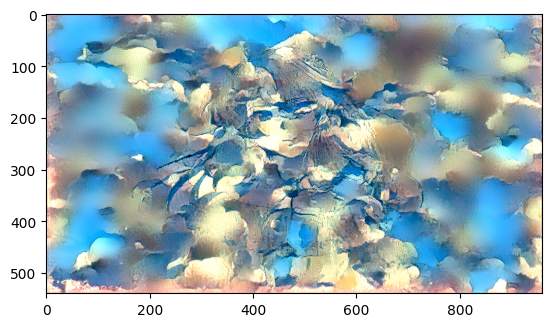

In [15]:
show_images(trainer_2,res_2)

0 ---- 73.82526397705078 


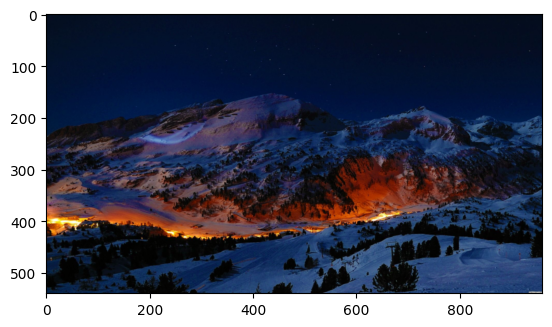

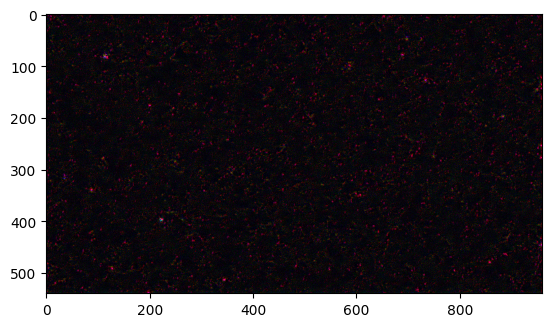

10 ---- 11.5481595993042 


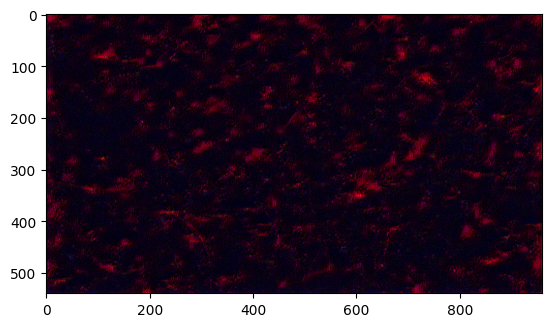

20 ---- 5.961222171783447 


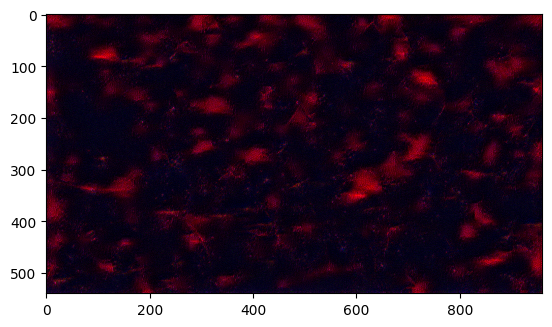

30 ---- 3.8863930702209473 


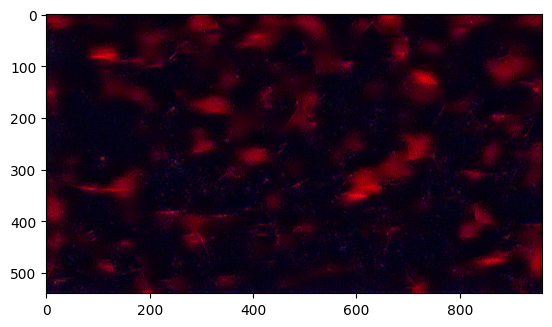

40 ---- 3.1350317001342773 


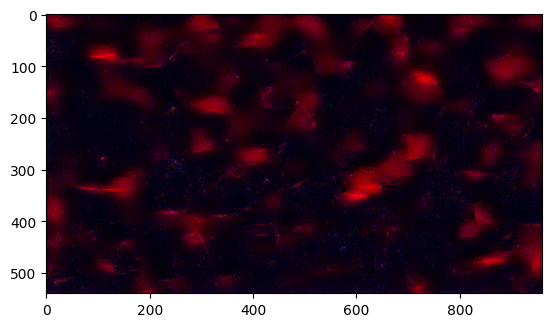

50 ---- 2.778064727783203 


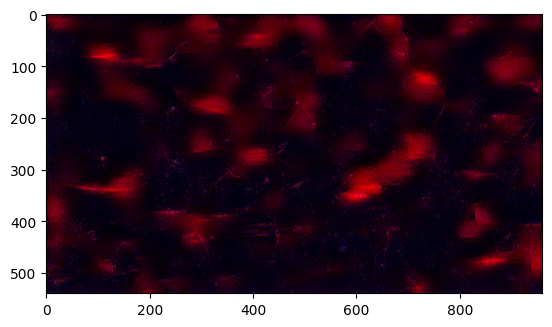

60 ---- 2.5574724674224854 


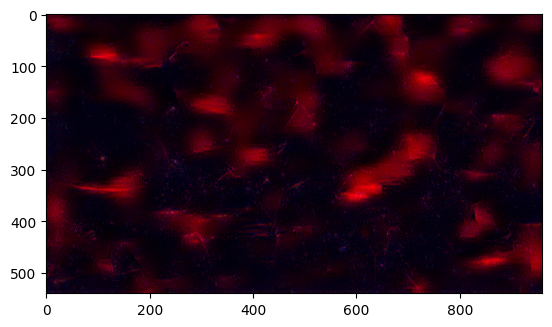

70 ---- 2.400029182434082 


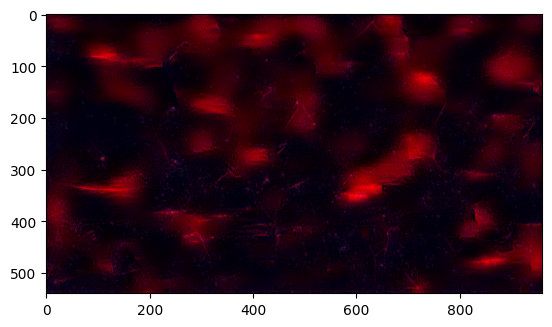

80 ---- 2.278141498565674 


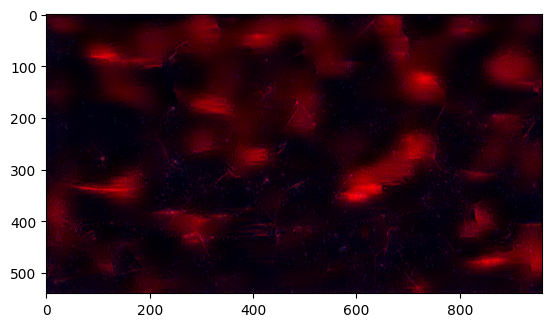

90 ---- 2.1833255290985107 


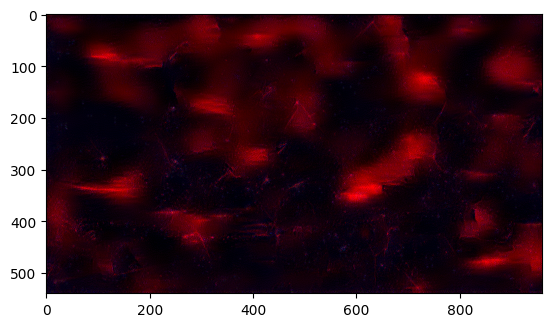

In [16]:
trainer_3 = TrainMat("/kaggle/input/ntstest/mountian.jpg",["/kaggle/input/ntstest/nightanime.jpg"],[1],100,(1080//2,1920//2))
res_3 = trainer_3.train_style() 
# /kaggle/input/ntstest/nightanime.jpg

Style 0


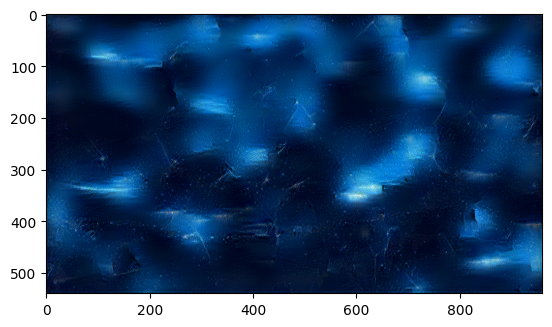

Generated


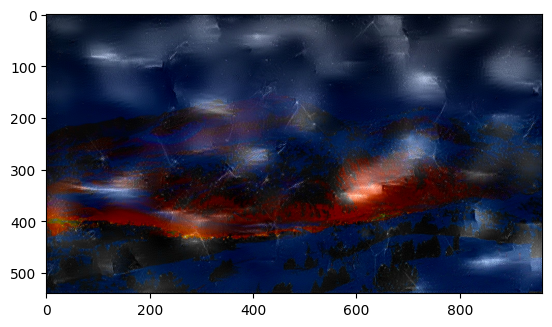

Original Color Space


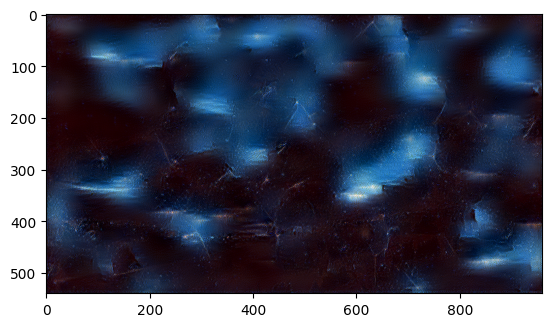

In [17]:
show_images(trainer_3,res_3)

0 ---- 48.70345687866211 


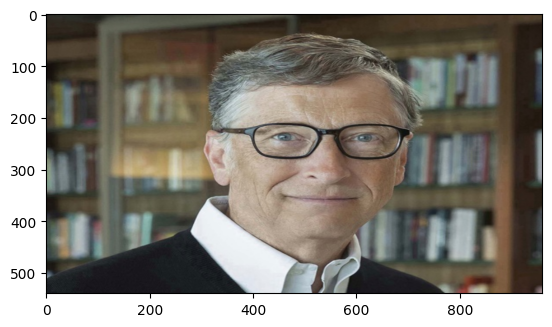

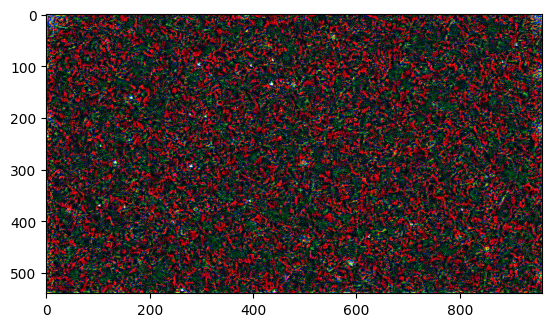

10 ---- 3.337218761444092 


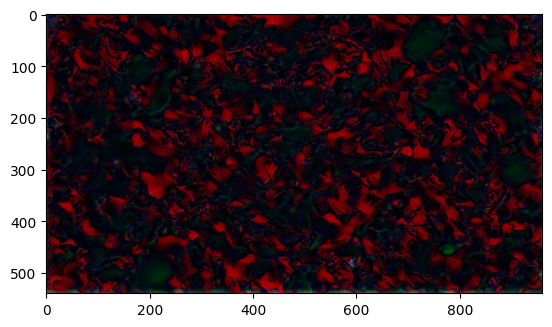

20 ---- 2.0212314128875732 


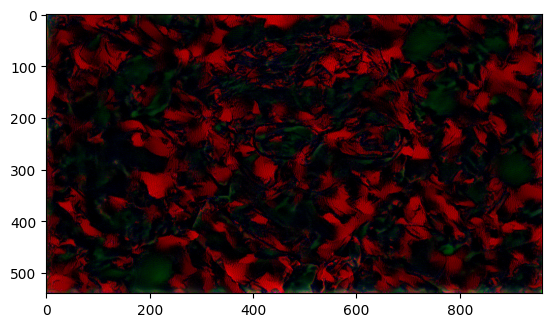

30 ---- 1.5712369680404663 


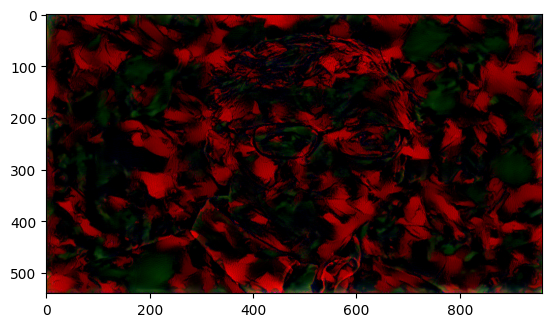

40 ---- 1.4014899730682373 


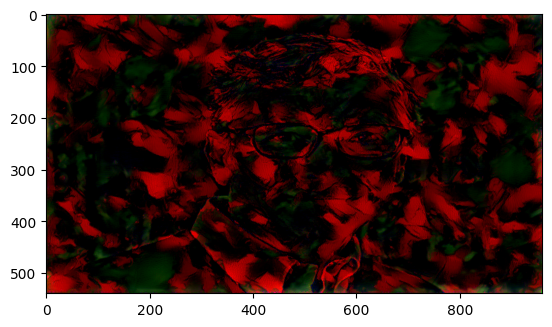

50 ---- 1.3287992477416992 


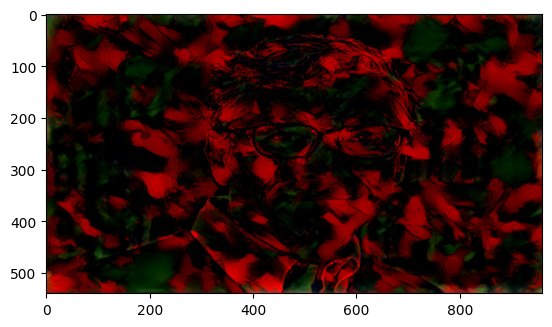

60 ---- 1.2902518510818481 


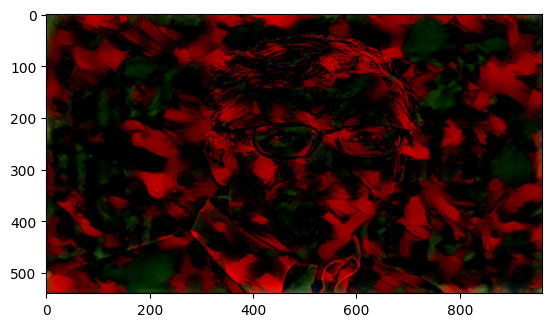

70 ---- 1.2643145322799683 


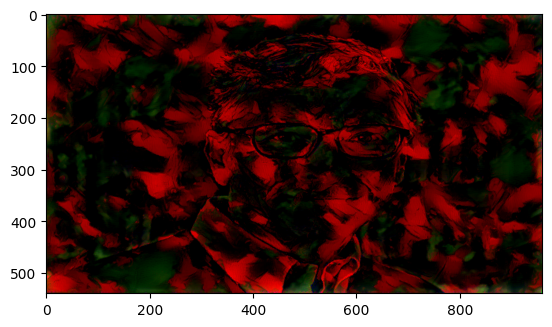

80 ---- 1.245715856552124 


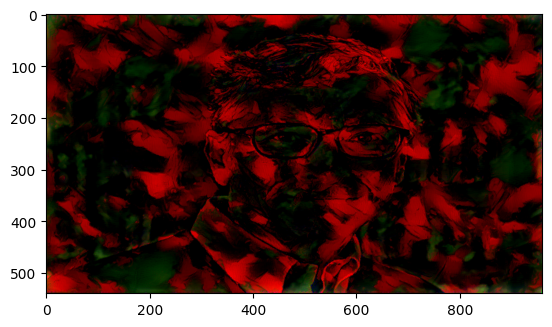

90 ---- 1.2319884300231934 


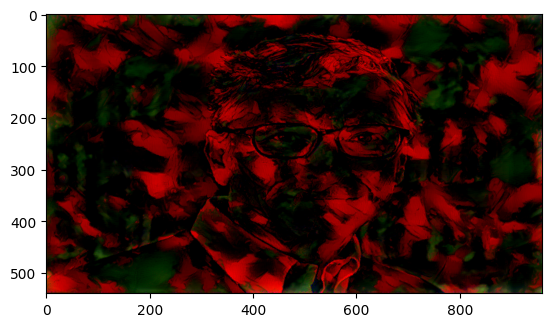

In [18]:
trainer_4 = TrainMat("/kaggle/input/ntstest/GA311881_Bill_Gates.jpg",["/kaggle/input/ntstest/abstract.jpg"],[10],100,(1080//2,1920//2))
res_4 = trainer_4.train_style()

Style 0


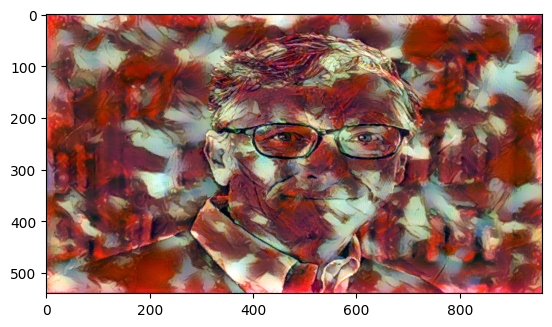

Generated


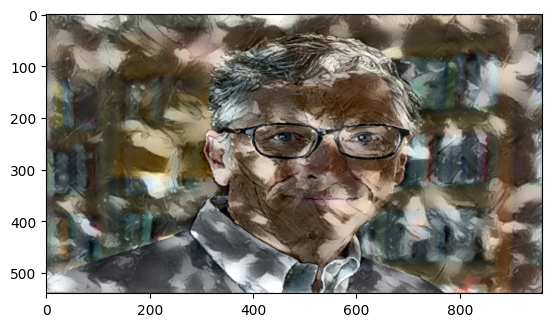

Original Color Space


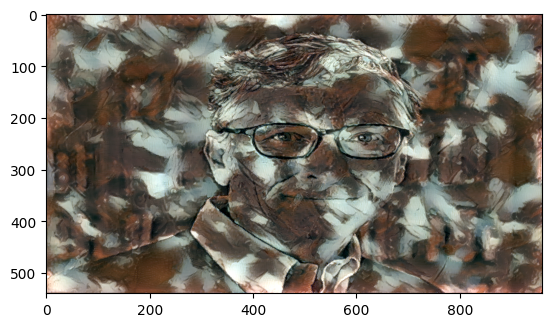

In [19]:
show_images(trainer_4,res_4)